In [1]:
import numpy as np
import pandas as pd
import os
from IPython.display import display, HTML
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio
import joblib

import seaborn as sns
from importlib import reload
import matplotlib.pyplot as plt
import matplotlib
import warnings
from IPython.display import display, HTML
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import numpy as np
import shap 
import lime# SHAP for explainability
from lime.lime_tabular import LimeTabularExplainer  # LIME for local explanations
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import pandas as pd
import time
import copy
import matplotlib.pyplot as plt
import seaborn as sns
import random
import tensorflow as tf





# Configure Jupyter Notebook
pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', 500) 
pd.set_option('display.expand_frame_repr', False)
# pd.set_option('max_colwidth', -1)
display(HTML("<style>div.output_scroll { height: 35em; }</style>"))

reload(plt) #ensures any changes made to matplotlib.pyplot during the session are applied.
%matplotlib inline
%config InlineBackend.figure_format ='retina'

warnings.filterwarnings('ignore')

# configure plotly graph objects
pio.renderers.default = 'iframe'
# pio.renderers.default = 'vscode'

pio.templates["ck_template"] = go.layout.Template(
    layout_colorway = px.colors.sequential.Viridis, 
#     layout_hovermode = 'closest',
#     layout_hoverdistance = -1,
    layout_autosize=False,
    layout_width=800,
    layout_height=600,
    layout_font = dict(family="Calibri Light"),
    layout_title_font = dict(family="Calibri"),
    layout_hoverlabel_font = dict(family="Calibri Light"),
#     plot_bgcolor="white",
)
 
# pio.templates.default = 'seaborn+ck_template+gridon'
pio.templates.default = 'ck_template+gridon'
# pio.templates.default = 'seaborn+gridon'
# pio.templates

c:\Users\tonya\Anaconda3\envs\fl_project_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [20]:

df = pd.read_csv('./dataset/DNN-EdgeIIoT-dataset.csv', low_memory=False)

In [21]:
df

,frame.time,ip.src_host,ip.dst_host,arp.dst.proto_ipv4,arp.opcode,arp.hw.size,arp.src.proto_ipv4,icmp.checksum,icmp.seq_le,icmp.transmit_timestamp,icmp.unused,http.file_data,http.content_length,http.request.uri.query,http.request.method,http.referer,http.request.full_uri,http.request.version,http.response,http.tls_port,tcp.ack,tcp.ack_raw,tcp.checksum,tcp.connection.fin,tcp.connection.rst,tcp.connection.syn,tcp.connection.synack,tcp.dstport,tcp.flags,tcp.flags.ack,tcp.len,tcp.options,tcp.payload,tcp.seq,tcp.srcport,udp.port,udp.stream,udp.time_delta,dns.qry.name,dns.qry.name.len,dns.qry.qu,dns.qry.type,dns.retransmission,dns.retransmit_request,dns.retransmit_request_in,mqtt.conack.flags,mqtt.conflag.cleansess,mqtt.conflags,mqtt.hdrflags,mqtt.len,mqtt.msg_decoded_as,mqtt.msg,mqtt.msgtype,mqtt.proto_len,mqtt.protoname,mqtt.topic,mqtt.topic_len,mqtt.ver,mbtcp.len,mbtcp.trans_id,mbtcp.unit_id,Attack_label,Attack_type
0,2021 11:44:10.081753000,192.168.0.128,192.168.0.101,0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.153346e+09,47892.0,0.0,0.0,0.0,1.0,64855.0,18.0,1.0,0.0,020405b40101040201030307,0,0.0,1883.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal
1,2021 11:44:10.162218000,192.168.0.101,192.168.0.128,0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.447945e+08,16077.0,0.0,0.0,0.0,0.0,1883.0,24.0,1.0,14.0,0,100c00044d5154540402003c0000,1.0,64855.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,1.0,2.0,16.0,12.0,0.0,0,1.0,4.0,MQTT,0,0.0,4.0,0.0,0.0,0.0,0,Normal
2,2021 11:44:10.162271000,192.168.0.128,192.168.0.101,0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,3.153346e+09,62675.0,0.0,0.0,0.0,0.0,64855.0,16.0,1.0,0.0,0,0,1.0,1883.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal
3,2021 11:44:10.162641000,192.168.0.128,192.168.0.101,0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,3.153346e+09,54469.0,0.0,0.0,0.0,0.0,64855.0,24.0,1.0,4.0,0,20020000,1.0,1883.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0x00000000,0.0,0.0,32.0,2.0,0.0,0,2.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal
4,2021 11:44:10.166132000,192.168.0.101,192.168.0.128,0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,3.447945e+08,53812.0,0.0,0.0,0.0,0.0,1883.0,24.0,1.0,41.0,0,3027001854656d70657261747572655f616e645f48756d...,15.0,64855.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,48.0,39.0,0.0,32342e36382037362e34320d0a,3.0,0.0,0,Temperature_and_Humidity,24.0,0.0,0.0,0.0,0.0,0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219196,2021 23:24:32.816050000,166.75.162.225,192.168.0.128,0,0.0,0.0,0,31814.0,45620.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,DDoS_ICMP
2219197,2021 23:24:32.816595000,70.162.34.183,192.168.0.128,0,0.0,0.0,0,27718.0,45636.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,DDoS_ICMP
2219198,2021 23:24:32.818043000,40.13.95.244,192.168.0.128,0,0.0,0.0,0,18502.0,45672.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,DDoS_ICMP
2219199,2021 23:24:32.820831000,18.132.75.125,192.168.0.128,0,0.0,0.0,0,1862.0,45737.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [6]:
print(df['Attack_type'].value_counts())

Attack_type
Normal                   1615643
DDoS_UDP                  121568
DDoS_ICMP                 116436
SQL_injection              51203
Password                   50153
Vulnerability_scanner      50110
DDoS_TCP                   50062
DDoS_HTTP                  49911
Uploading                  37634
Backdoor                   24862
Port_Scanning              22564
XSS                        15915
Ransomware                 10925
MITM                        1214
Fingerprinting              1001
Name: count, dtype: int64


In [15]:
ipp =[]
ips= df['ip.src_host'].value_counts() 
for ip, count in ips.items():
    if count > 100:
        ipp.append(ip)

In [ ]:
df = df[df['ip.dst_host'].isin(ipp) & df['ip.src_host'].isin(ipp) ]

In [23]:
df

,frame.time,ip.src_host,ip.dst_host,arp.dst.proto_ipv4,arp.opcode,arp.hw.size,arp.src.proto_ipv4,icmp.checksum,icmp.seq_le,icmp.transmit_timestamp,icmp.unused,http.file_data,http.content_length,http.request.uri.query,http.request.method,http.referer,http.request.full_uri,http.request.version,http.response,http.tls_port,tcp.ack,tcp.ack_raw,tcp.checksum,tcp.connection.fin,tcp.connection.rst,tcp.connection.syn,tcp.connection.synack,tcp.dstport,tcp.flags,tcp.flags.ack,tcp.len,tcp.options,tcp.payload,tcp.seq,tcp.srcport,udp.port,udp.stream,udp.time_delta,dns.qry.name,dns.qry.name.len,dns.qry.qu,dns.qry.type,dns.retransmission,dns.retransmit_request,dns.retransmit_request_in,mqtt.conack.flags,mqtt.conflag.cleansess,mqtt.conflags,mqtt.hdrflags,mqtt.len,mqtt.msg_decoded_as,mqtt.msg,mqtt.msgtype,mqtt.proto_len,mqtt.protoname,mqtt.topic,mqtt.topic_len,mqtt.ver,mbtcp.len,mbtcp.trans_id,mbtcp.unit_id,Attack_label,Attack_type
0,2021 11:44:10.081753000,192.168.0.128,192.168.0.101,0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.153346e+09,47892.0,0.0,0.0,0.0,1.0,64855.0,18.0,1.0,0.0,020405b40101040201030307,0,0.0,1883.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal
1,2021 11:44:10.162218000,192.168.0.101,192.168.0.128,0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.447945e+08,16077.0,0.0,0.0,0.0,0.0,1883.0,24.0,1.0,14.0,0,100c00044d5154540402003c0000,1.0,64855.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,1.0,2.0,16.0,12.0,0.0,0,1.0,4.0,MQTT,0,0.0,4.0,0.0,0.0,0.0,0,Normal
2,2021 11:44:10.162271000,192.168.0.128,192.168.0.101,0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,3.153346e+09,62675.0,0.0,0.0,0.0,0.0,64855.0,16.0,1.0,0.0,0,0,1.0,1883.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal
3,2021 11:44:10.162641000,192.168.0.128,192.168.0.101,0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,3.153346e+09,54469.0,0.0,0.0,0.0,0.0,64855.0,24.0,1.0,4.0,0,20020000,1.0,1883.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0x00000000,0.0,0.0,32.0,2.0,0.0,0,2.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal
4,2021 11:44:10.166132000,192.168.0.101,192.168.0.128,0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,3.447945e+08,53812.0,0.0,0.0,0.0,0.0,1883.0,24.0,1.0,41.0,0,3027001854656d70657261747572655f616e645f48756d...,15.0,64855.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,48.0,39.0,0.0,32342e36382037362e34320d0a,3.0,0.0,0,Temperature_and_Humidity,24.0,0.0,0.0,0.0,0.0,0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2119102,2021 23:19:08.537788000,0,0,192.168.0.170,2.0,6.0,192.168.0.128,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,DDoS_ICMP
2125504,2021 23:19:20.459399000,0,0,192.168.0.1,1.0,6.0,192.168.0.128,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,DDoS_ICMP
2137157,2021 23:19:43.484682000,0,0,192.168.0.170,2.0,6.0,192.168.0.128,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,DDoS_ICMP
2199052,2021 23:23:31.958784000,0,0,192.168.0.128,2.0,6.0,192.168.0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [12]:
ipd= df['ip.src_host'].value_counts() 
for ip, count in ipd.items():
    if count > 100:
        print(f"IP: {ip}, Count: {count}")

IP: 192.168.0.128, Count: 962133
IP: 192.168.0.101, Count: 667281
IP: 0, Count: 285604
IP: 192.168.0.170, Count: 164982
IP: 0.0.0.0, Count: 1017
IP: 192.168.0.1, Count: 689
IP: 192.168.0.152, Count: 120


In [8]:
drop_columns = ["frame.time", "ip.src_host", "ip.dst_host", "arp.src.proto_ipv4","arp.dst.proto_ipv4", 

         "http.file_data","http.request.full_uri","icmp.transmit_timestamp",

         "http.request.uri.query", "tcp.options","tcp.payload","tcp.srcport",

         "tcp.dstport", "udp.port", "mqtt.msg", 'icmp.unused','dns.qry.type','mqtt.msg_decoded_as']

df.drop(drop_columns, axis=1, inplace=True)

df.dropna(axis=0, how='any', inplace=True)

df.drop_duplicates(subset=None, keep="first", inplace=True)

df = shuffle(df).reset_index(drop=True)

df.isna().sum()

print(df['Attack_type'].value_counts())

Attack_type
Normal                   1363998
DDoS_UDP                  121567
DDoS_ICMP                  67939
SQL_injection              50826
DDoS_TCP                   50062
Vulnerability_scanner      50026
Password                   49933
DDoS_HTTP                  48544
Uploading                  36807
Backdoor                   24026
Port_Scanning              19977
XSS                        15066
Ransomware                  9689
Fingerprinting               853
MITM                         358
Name: count, dtype: int64


In [9]:
df.head(10)

,arp.opcode,arp.hw.size,icmp.checksum,icmp.seq_le,http.content_length,http.request.method,http.referer,http.request.version,http.response,http.tls_port,tcp.ack,tcp.ack_raw,tcp.checksum,tcp.connection.fin,tcp.connection.rst,tcp.connection.syn,tcp.connection.synack,tcp.flags,tcp.flags.ack,tcp.len,tcp.seq,udp.stream,udp.time_delta,dns.qry.name,dns.qry.name.len,dns.qry.qu,dns.retransmission,dns.retransmit_request,dns.retransmit_request_in,mqtt.conack.flags,mqtt.conflag.cleansess,mqtt.conflags,mqtt.hdrflags,mqtt.len,mqtt.msgtype,mqtt.proto_len,mqtt.protoname,mqtt.topic,mqtt.topic_len,mqtt.ver,mbtcp.len,mbtcp.trans_id,mbtcp.unit_id,Attack_label,Attack_type
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,1.055425e+09,39752.0,0.0,0.0,0.0,0.0,24.0,1.0,41.0,15.0,0.0,0.0,0.000000,0,0.0,0.0,0.0,0.0,0,0.0,0.0,48.0,39.0,3.0,0.0,0,Temperature_and_Humidity,24.0,0.0,0.0,0.0,0.0,0,Normal
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2.158616e+09,30903.0,0.0,0.0,0.0,0.0,16.0,1.0,0.0,59.0,0.0,0.0,0.000000,0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.453307e+09,39083.0,0.0,0.0,0.0,0.0,24.0,1.0,208.0,1703969.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,Backdoor
3,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,0.000000e+00,33534.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,DDoS_HTTP
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25389.0,2.371650e+09,29307.0,0.0,0.0,0.0,0.0,16.0,1.0,0.0,6060661.0,0.0,0.0,0.000000,0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0,1.128377e+09,14161.0,0.0,0.0,0.0,0.0,16.0,1.0,0.0,5.0,0.0,0.0,0.000000,0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,767606.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,DDoS_UDP
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.753386e+09,46739.0,0.0,0.0,0.0,0.0,16.0,1.0,0.0,1.0,0.0,0.0,0.000000,0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,59.0,4.581530e+08,22285.0,1.0,0.0,0.0,0.0,17.0,1.0,0.0,5.0,0.0,0.0,0.000000,0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56475.0,211.0,0.991412,0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,Normal


In [10]:
df.describe()

,arp.opcode,arp.hw.size,icmp.checksum,icmp.seq_le,http.content_length,http.response,http.tls_port,tcp.ack,tcp.ack_raw,tcp.checksum,tcp.connection.fin,tcp.connection.rst,tcp.connection.syn,tcp.connection.synack,tcp.flags,tcp.flags.ack,tcp.len,tcp.seq,udp.stream,udp.time_delta,dns.qry.name,dns.qry.qu,dns.retransmission,dns.retransmit_request,dns.retransmit_request_in,mqtt.conflag.cleansess,mqtt.conflags,mqtt.hdrflags,mqtt.len,mqtt.msgtype,mqtt.proto_len,mqtt.topic_len,mqtt.ver,mbtcp.len,mbtcp.trans_id,mbtcp.unit_id,Attack_label
count,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1909671.0,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06,1.909671e+06
mean,1.989872e-05,7.854756e-05,1.175958e+03,1.363339e+03,5.587576e+00,1.707257e-02,0.0,2.647284e+07,1.727409e+09,2.946615e+04,1.009200e-01,4.625404e-02,6.147918e-02,5.073178e-02,1.565365e+01,8.113110e-01,1.387620e+02,9.893109e+06,8.365584e+04,4.038999e-01,8.569703e+03,8.410716e-02,1.357878e-02,2.565887e-05,2.094602e-05,4.347241e-02,8.694482e-02,1.391061e+01,2.303975e+00,8.694131e-01,1.738896e-01,1.043300e+00,1.738896e-01,1.508113e-03,6.008888e-03,1.094429e-04,2.857419e-01
std,5.789063e-03,2.170897e-02,7.069987e+03,7.575630e+03,1.039227e+02,1.295419e-01,0.0,1.774881e+08,1.297809e+09,2.047895e+04,3.012228e-01,2.100348e-01,2.402072e-01,2.194495e-01,7.756756e+00,3.912615e-01,4.741009e+02,3.680676e+07,3.927393e+05,1.233684e+01,1.284348e+05,6.664079e+00,6.050969e-01,5.065395e-03,4.576635e-03,2.039181e-01,4.078361e-01,4.629755e+01,8.200292e+00,2.893597e+00,8.156723e-01,4.893949e+00,8.156723e-01,1.844972e-01,7.790471e-01,1.484739e-02,4.517672e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,1.000000e+00,4.938189e+08,1.088700e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.600000e+01,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,6.000000e+00,1.707952e+09,2.905400e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.600000e+01,1.000000e+00,0.000000e+00,5.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,1.210000e+02,2.634510e+09,4.731100e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.400000e+01,1.000000e+00,1.400000e+01,5.900000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
max,2.000000e+00,6.000000e+00,6.553300e+04,6.553500e+04,8.365500e+04,1.000000e+00,0.0,3.949529e+09,4.294947e+09,6.553500e+04,1.

In [11]:
DEBUG = 1


print(f"Applying log transformation")
df_numeric = df.select_dtypes(include=[np.number])

for feature in df_numeric.columns:
    if DEBUG == 1:
        print(f"Feature: {feature}")
        print('nunique =', df_numeric[feature].nunique())
        print('More than 50 unique values:', df_numeric[feature].nunique() > 50)
        print('----------------------------------------------------')
    
    # Apply log transformation if the column has more than 50 unique values
    if df_numeric[feature].nunique() > 50:
        if df_numeric[feature].min() == 0:
            df[feature] = np.log(df[feature] + 1)
        else:
            df[feature] = np.log(df[feature])

print(f"Data after log transformation:\n", df.head())


Applying log transformation
Feature: arp.opcode
nunique = 3
More than 50 unique values: False
----------------------------------------------------
Feature: arp.hw.size
nunique = 2
More than 50 unique values: False
----------------------------------------------------
Feature: icmp.checksum
nunique = 54645
More than 50 unique values: True
----------------------------------------------------
Feature: icmp.seq_le
nunique = 56328
More than 50 unique values: True
----------------------------------------------------
Feature: http.content_length
nunique = 43
More than 50 unique values: False
----------------------------------------------------
Feature: http.response
nunique = 2
More than 50 unique values: False
----------------------------------------------------
Feature: http.tls_port
nunique = 1
More than 50 unique values: False
----------------------------------------------------
Feature: tcp.ack
nunique = 146980
More than 50 unique values: True
---------------------------------------------

In [12]:

from sklearn.preprocessing import StandardScaler

numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
numeric_cols.remove('Attack_label')

# Scale only numeric (continuous) features
scaler = StandardScaler()
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])


In [13]:
# Display descriptive statistics for categorical columns
print(f"Descriptive statistics for categorical columns:")
df_cat = df.select_dtypes(exclude=[np.number])
print(df_cat.describe(include='all'))
print("\n")

Descriptive statistics for categorical columns:
       http.request.method http.referer http.request.version dns.qry.name.len mqtt.conack.flags mqtt.protoname mqtt.topic Attack_type
count              1909671      1909671              1909671          1909671           1909671        1909671    1909671     1909671
unique                   9            5                   13               10                13              3          3          15
top                    0.0          0.0                  0.0                0                 0              0          0      Normal
freq               1658469      1796035              1658111          1362163           1280941        1280980    1280983     1363998




In [14]:
df.head(5)

,arp.opcode,arp.hw.size,icmp.checksum,icmp.seq_le,http.content_length,http.request.method,http.referer,http.request.version,http.response,http.tls_port,tcp.ack,tcp.ack_raw,tcp.checksum,tcp.connection.fin,tcp.connection.rst,tcp.connection.syn,tcp.connection.synack,tcp.flags,tcp.flags.ack,tcp.len,tcp.seq,udp.stream,udp.time_delta,dns.qry.name,dns.qry.name.len,dns.qry.qu,dns.retransmission,dns.retransmit_request,dns.retransmit_request_in,mqtt.conack.flags,mqtt.conflag.cleansess,mqtt.conflags,mqtt.hdrflags,mqtt.len,mqtt.msgtype,mqtt.proto_len,mqtt.protoname,mqtt.topic,mqtt.topic_len,mqtt.ver,mbtcp.len,mbtcp.trans_id,mbtcp.unit_id,Attack_label,Attack_type
0,-0.003437,-0.003618,-0.191939,-0.207546,-0.053767,0.0,0.0,0.0,-0.131792,0.0,-0.479253,0.395453,0.476709,-0.335034,-0.220221,-0.255942,-0.231177,1.076011,0.482258,0.977349,-0.221948,-0.260804,-0.035767,-0.078183,0,-0.031625,-0.022441,-0.005066,-0.004577,0,-0.213186,-0.213186,0.736311,4.474967,0.736311,-0.213186,0,Temperature_and_Humidity,4.690834,-0.213186,-0.008174,-0.008681,-0.007371,0,Normal
1,-0.003437,-0.003618,-0.191939,-0.207546,-0.053767,0.0,0.0,0.0,-0.131792,0.0,-0.479253,0.485226,0.397610,-0.335034,-0.220221,-0.255942,-0.231177,0.044652,0.482258,-0.599539,0.015429,-0.260804,-0.035767,-0.078183,0,-0.031625,-0.022441,-0.005066,-0.004577,0,-0.213186,-0.213186,-0.300461,-0.280963,-0.300461,-0.213186,0,0,-0.213182,-0.213186,-0.008174,-0.008681,-0.007371,0,Normal
2,-0.003437,-0.003618,-0.191939,-0.207546,-0.053767,0.0,0.0,0.0,-0.131792,0.0,-0.685296,0.435589,0.471378,-0.335034,-0.220221,-0.255942,-0.231177,1.076011,0.482258,1.654342,1.856985,-0.260804,-0.035767,-0.078183,0.0,-0.031625,-0.022441,-0.005066,-0.004577,0.0,-0.213186,-0.213186,-0.300461,-0.280963,-0.300461,-0.213186,0.0,0.0,-0.213182,-0.213186,-0.008174,-0.008681,-0.007371,1,Backdoor
3,-0.003437,-0.003618,-0.191939,-0.207546,-0.053767,0,0,0,-0.131792,0.0,-0.815294,-2.211383,0.423276,-0.335034,-0.220221,3.907131,-0.231177,-1.760227,-2.073578,-0.599539,-0.719882,-0.260804,-0.035767,-0.078183,0.0,-0.031625,-0.022441,-0.005066,-0.004577,0.0,-0.213186,-0.213186,-0.300461,-0.280963,-0.300461,-0.213186,0.0,0.0,-0.213182,-0.213186,-0.008174,-0.008681,-0.007371,1,DDoS_HTTP
4,-0.003437,-0.003618,-0.191939,-0.207546,-0.053767,0.0,0.0,0.0,-0.131792,0.0,1.086842,0.497035,0.380952,-0.335034,-0.220221,-0.255942,-0.231177,0.044652,0.482258,-0.599539,2.084862,-0.260804,-0.035767,-0.078183,0,-0.031625,-0.022441,-0.005066,-0.004577,0,-0.213186,-0.213186,-0.300461,-0.280963,-0.300461,-0.213186,0,0,-0.213182,-0.213186,-0.008174,-0.008681,-0.007371,0,Normal


In [15]:
print(df['http.referer'].value_counts()) #done
print(df['http.request.method'].value_counts()) #done
print(df['http.request.version'].value_counts()) #done
print(df['dns.qry.name.len'].value_counts()) #done
print(df['mqtt.conack.flags'].value_counts())  #done
print(df['mqtt.protoname'].value_counts()) #done
print(df['mqtt.topic'].value_counts()) #done

http.referer
0.0                                                                     1796035
0                                                                        113066
127.0.0.1                                                                   383
() { _; } >_[$($())] { echo 93e4r0-CVE-2014-6278: true; echo;echo; }        185
TESTING_PURPOSES_ONLY                                                         2
Name: count, dtype: int64
http.request.method
0.0         1658469
0            219116
GET           30473
POST           1212
TRACE           387
OPTIONS           6
PROPFIND          4
PUT               2
SEARCH            2
Name: count, dtype: int64
http.request.version
0.0                                                                                1658111
0                                                                                   219474
HTTP/1.1                                                                             28681
HTTP/1.0                                 

In [16]:
DEBUG = 1  # Set to 1 to see detailed output, 0 to suppress


print(f"\nProcessing categorical columns ")
df_cat = df.select_dtypes(exclude=[np.number])

for feature in df_cat.columns:
    # Skip the attack_cat column (or attack_cat_encoded if numeric)
    if feature == 'Attack_type':
        continue
    
    # Set the unique count limit based on the feature
    if feature == 'http.request.method':
        unique_limit = 6
    elif feature == 'http.referer':
        unique_limit = 5
    elif feature == 'http.request.version':
        unique_limit = 4
    elif feature == 'dns.qry.name.len':
        unique_limit = 6
    elif feature == 'mqtt.conack.flags':
        unique_limit = 4
    elif feature == 'mqtt.protoname':
        unique_limit = 3  
    elif feature == 'mqtt.topic':
        unique_limit = 3
    else:
        continue  # Skip if it's not proto, service, or state
    
    # Count unique values
    unique_count = df_cat[feature].nunique()
    
    if DEBUG == 1:
        print(f"Feature: {feature}")
        print('Unique values count =', unique_count)
        print(f"Threshold exceeded (more than {unique_limit} unique values):", unique_count > unique_limit)
        print("----------------------------------------------------")
    
    # Keep only the top categories if unique count exceeds the specified limit
    if unique_count > unique_limit:
        # Get the most frequent categories (e.g., top N based on unique_limit) and replace the rest with '-'
        top_categories = df_cat[feature].value_counts().nlargest(unique_limit - 1).index  # Adjust limit as needed
        df[feature] = np.where(
            df[feature].isin(top_categories),
            df[feature],
            '-'  # Replace with '-'
        )


df_cat = df.select_dtypes(exclude=[np.number])
print(f"\ Categorical data after processing:\n", df_cat.describe(include='all'))


Processing categorical columns 
Feature: http.request.method
Unique values count = 9
Threshold exceeded (more than 6 unique values): True
----------------------------------------------------
Feature: http.referer
Unique values count = 5
Threshold exceeded (more than 5 unique values): False
----------------------------------------------------
Feature: http.request.version
Unique values count = 13
Threshold exceeded (more than 4 unique values): True
----------------------------------------------------
Feature: dns.qry.name.len
Unique values count = 10
Threshold exceeded (more than 6 unique values): True
----------------------------------------------------
Feature: mqtt.conack.flags
Unique values count = 13
Threshold exceeded (more than 4 unique values): True
----------------------------------------------------
Feature: mqtt.protoname
Unique values count = 3
Threshold exceeded (more than 3 unique values): False
----------------------------------------------------
Feature: mqtt.topic
Uniq

In [17]:
print(f"\nTop categories ")

# Display top 6 categories for 'http.request.method'
unique_http_request_method = df['http.request.method'].value_counts().nlargest(6).index
unique_http_request_method_list = unique_http_request_method.tolist()
print(f"Top 'http.request.method' categories: {unique_http_request_method_list}")
# Display top 6 categories for 'http.referer'
unique_http_referer = df['http.referer'].value_counts().nlargest(6).index
unique_http_referer_list = unique_http_referer.tolist()
print(f"Top 'http.referer' categories: {unique_http_referer_list}")
# Display top 4 categories for 'http.request.version'   
unique_http_request_version = df['http.request.version'].value_counts().nlargest(4).index
unique_http_request_version_list = unique_http_request_version.tolist()
print(f"Top 'http.request.version' categories: {unique_http_request_version_list}")
# Display top 6 categories for 'dns.qry.name.len'
unique_dns_qry_name_len = df['dns.qry.name.len'].value_counts().nlargest(6).index
unique_dns_qry_name_len_list = unique_dns_qry_name_len.tolist()
print(f"Top 'dns.qry.name.len' categories: {unique_dns_qry_name_len_list}")
# Display top 4 categories for 'mqtt.conack.flags'      
unique_mqtt_conack_flags = df['mqtt.conack.flags'].value_counts().nlargest(4).index
unique_mqtt_conack_flags_list = unique_mqtt_conack_flags.tolist()
print(f"Top 'mqtt.conack.flags' categories: {unique_mqtt_conack_flags_list}")
# Display top 3 categories for 'mqtt.protoname' 
unique_mqtt_protoname = df['mqtt.protoname'].value_counts().nlargest(3).index
unique_mqtt_protoname_list = unique_mqtt_protoname.tolist()
print(f"Top 'mqtt.protoname' categories: {unique_mqtt_protoname_list}")
# Display top 3 categories for 'mqtt.topic'
unique_mqtt_topic = df['mqtt.topic'].value_counts().nlargest(3).index
unique_mqtt_topic_list = unique_mqtt_topic.tolist()
print(f"Top 'mqtt.topic' categories: {unique_mqtt_topic_list}")


Top categories 
Top 'http.request.method' categories: ['0.0', '0', 'GET', 'POST', 'TRACE', '-']
Top 'http.referer' categories: ['0.0', '0', '127.0.0.1', '() { _; } >_[$($())] { echo 93e4r0-CVE-2014-6278: true; echo;echo; }', 'TESTING_PURPOSES_ONLY']
Top 'http.request.version' categories: ['0.0', '0', 'HTTP/1.1', '-']
Top 'dns.qry.name.len' categories: ['0', '0.0', '-', '0.debian.pool.ntp.org', '3.debian.pool.ntp.org', '2.debian.pool.ntp.org']
Top 'mqtt.conack.flags' categories: ['0', '0.0', '0x00000000', '-']
Top 'mqtt.protoname' categories: ['0', '0.0', 'MQTT']
Top 'mqtt.topic' categories: ['0', '0.0', 'Temperature_and_Humidity']


In [18]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

print(f"\nApplying one-hot encoding")

# Define which columns you want to encode
encoded_cols = ['http.request.method', 'http.referer', 'http.request.version',
                'dns.qry.name.len', 'mqtt.conack.flags', 'mqtt.protoname', 'mqtt.topic']

# Define the ColumnTransformer with fixed categories for each column
ct = ColumnTransformer(
    transformers=[
        ('encoder', OneHotEncoder(categories=[
            unique_http_request_method_list,
            unique_http_referer_list,
            unique_http_request_version_list,
            unique_dns_qry_name_len_list,
            unique_mqtt_conack_flags_list,
            unique_mqtt_protoname_list,
            unique_mqtt_topic_list
        ], handle_unknown='ignore'), encoded_cols)
    ]
)

# Apply transformation
X_encoded = ct.fit_transform(df)

# Convert sparse matrix to dense array
X_encoded = X_encoded.toarray()

# Get feature names from encoder
feature_names = ct.get_feature_names_out()

# Create DataFrame from encoded features
df_encoded = pd.DataFrame(X_encoded, columns=feature_names, index=df.index)

# Drop the original categorical columns from df
df_other = df.drop(columns=encoded_cols)

# Combine the rest of the DataFrame with the encoded features
df = pd.concat([df_other, df_encoded], axis=1)

# Print the shape to confirm
print(f"Number of features : {df.shape[1]}")


Applying one-hot encoding
Number of features : 69


In [ ]:
# def encode_text_dummy(df, name):

#     dummies = pd.get_dummies(df[name])

#     for x in dummies.columns:

#         dummy_name = f"{name}-{x}"

#         df[dummy_name] = dummies[x]

#     df.drop(name, axis=1, inplace=True)


In [ ]:
# for col in ['http.request.method', 'http.referer', 'http.request.version',
#             'dns.qry.name.len', 'mqtt.conack.flags', 'mqtt.protoname', 'mqtt.topic']:
#         encode_text_dummy(df, col)

In [19]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df['Attack_type'] = label_encoder.fit_transform(df['Attack_type'])

# Store class mapping (optional)
attack_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Label mapping:", attack_mapping)


Label mapping: {'Backdoor': np.int64(0), 'DDoS_HTTP': np.int64(1), 'DDoS_ICMP': np.int64(2), 'DDoS_TCP': np.int64(3), 'DDoS_UDP': np.int64(4), 'Fingerprinting': np.int64(5), 'MITM': np.int64(6), 'Normal': np.int64(7), 'Password': np.int64(8), 'Port_Scanning': np.int64(9), 'Ransomware': np.int64(10), 'SQL_injection': np.int64(11), 'Uploading': np.int64(12), 'Vulnerability_scanner': np.int64(13), 'XSS': np.int64(14)}


label_mapping = {
    "Backdoor": 0,
    "DDoS_HTTP": 1,
    "DDoS_ICMP": 2,
    "DDoS_TCP": 3,
    "DDoS_UDP": 4,
    "Fingerprinting": 5,
    "MITM": 6,
    "Normal": 7,
    "Password": 8,
    "Port_Scanning": 9,
    "Ransomware": 10,
    "SQL_injection": 11,
    "Uploading": 12,
    "Vulnerability_scanner": 13,
    "XSS": 14
}


#### Checking with random forest

In [15]:
# X = df.drop(np.array(['Attack_type','Attack_label']), axis=1)
# y = df['Attack_type']


In [16]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [ ]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.metrics import classification_report, confusion_matrix

# clf = RandomForestClassifier(random_state=42)
# clf.fit(X_train, y_train)
# y_pred = clf.predict(X_test)

# print(confusion_matrix(y_test, y_pred))
# print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


In [20]:

# Define the number of clients
num_clients = 4

# Split the data horizontally for each client
client_data = {}
rows_per_client = len(df) // num_clients

for i in range(num_clients):
    start_idx = i * rows_per_client
    end_idx = (i + 1) * rows_per_client if i < num_clients - 1 else len(df)
    client_data[i] = df.iloc[start_idx:end_idx].copy()

# Display the shape of each client's data
for client_id, data in client_data.items():
    print(f"Client {client_id} data shape: {data.shape}")

Client 0 data shape: (477417, 69)
Client 1 data shape: (477417, 69)
Client 2 data shape: (477417, 69)
Client 3 data shape: (477420, 69)


## Modelling and Evaluation

In [21]:
# Initialize an empty DataFrame
model_performance = pd.DataFrame(columns=['Model', 'Accuracy', 'Recall', 'Precision', 'F1-Score', 
                                          'time to train', 'time to predict', 'total time'])

In [22]:
from sklearn.model_selection import train_test_split

# Prepare training and testing sets for each client and scale continuous features
client_train_data = {}
client_test_data = {}

for i in range(4):
    print(f"\nProcessing Client {i+1}")
    
    # Separate features and target
    X = client_data[i].drop(columns=['Attack_type','Attack_label'])  # All columns except the label
    y = client_data[i]['Attack_type']  # Label column (multiclass encoded)

    # Ensure target is integer-encoded (if not already)
    y = y.astype(int)

    # Split each client's data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=41, stratify=y)
    
    # Store the processed data for each client
    client_train_data[i] = (X_train, y_train)
    client_test_data[i] = (X_test, y_test)

    # Print confirmation of scaling for this client
    print(f"Completed scaling for Client {i+1}")
    print(f"Training set size: {X_train.shape[0]}, Testing set size: {X_test.shape[0]}")



Processing Client 1
Completed scaling for Client 1
Training set size: 334191, Testing set size: 143226

Processing Client 2
Completed scaling for Client 2
Training set size: 334191, Testing set size: 143226

Processing Client 3
Completed scaling for Client 3
Training set size: 334191, Testing set size: 143226

Processing Client 4
Completed scaling for Client 4
Training set size: 334194, Testing set size: 143226


In [23]:
# Display the shape of each client's training and test sets
for i in range(4):
    X_train, y_train = client_train_data[i]
    X_test, y_test = client_test_data[i]
    
    print(f"\nClient {i+1} Data Shapes:")
    print(f"  Training Set - X_train: {X_train.shape}, y_train: {y_train.shape}")
    print(f"  Test Set - X_test: {X_test.shape}, y_test: {y_test.shape}")
    print(len(y_train.unique()))
    print(len(y_test.unique()))



Client 1 Data Shapes:
  Training Set - X_train: (334191, 67), y_train: (334191,)
  Test Set - X_test: (143226, 67), y_test: (143226,)
15
15

Client 2 Data Shapes:
  Training Set - X_train: (334191, 67), y_train: (334191,)
  Test Set - X_test: (143226, 67), y_test: (143226,)
15
15

Client 3 Data Shapes:
  Training Set - X_train: (334191, 67), y_train: (334191,)
  Test Set - X_test: (143226, 67), y_test: (143226,)
15
15

Client 4 Data Shapes:
  Training Set - X_train: (334194, 67), y_train: (334194,)
  Test Set - X_test: (143226, 67), y_test: (143226,)
15
15


## Neural Network MLP

In [24]:

# Set Random Seed
seed = 42
np.random.seed(seed)
random.seed(seed)
tf.random.set_seed(seed)

# Configuration
num_rounds = 5 # Number of federated learning rounds
# epoch_schedule = [50, 50, 50, 50, 50, 50, 80, 80, 80, 80]  # Epochs per round
epoch_schedule = [5, 5, 5, 5, 5, 5, 8, 8, 8, 8]  # Epochs per round
hidden_layer_sizes = (20, 20)  # Hidden layer configuration
batch_size = 2000  # Batch size for MLP
learning_rate = 0.001  # Learning rate for MLP

# Global list of all possible classes
all_classes = np.unique(np.concatenate([client_train_data[i][1] for i in range(len(client_train_data))]))



# Initialize global model parameters
global_model = MLPClassifier(hidden_layer_sizes=hidden_layer_sizes, 
                             activation='relu', 
                             solver='adam', 
                             batch_size=batch_size, 
                             learning_rate_init=learning_rate, 
                             max_iter=1,  # One iteration per call to `fit`
                             warm_start=True, 
                             verbose=0)

# Perform a dummy fit to initialize the model structure with all classes
X_dummy = np.random.rand(15, client_train_data[0][0].shape[1])  # Random features
y_dummy = np.tile(all_classes, 1)[:15]  # Ensure all classes are present
global_model.fit(X_dummy, y_dummy)  # Dummy fit

# Assign global weights and biases from the initialized model
global_weights = copy.deepcopy(global_model.coefs_)
global_biases = copy.deepcopy(global_model.intercepts_)


### Aggregation Function

In [25]:

# Function to aggregate weights using FedAvg
def fed_avg(weights_list, biases_list):
    avg_weights = [np.mean([w[layer] for w in weights_list], axis=0) for layer in range(len(global_weights))]
    avg_biases = [np.mean([b[layer] for b in biases_list], axis=0) for layer in range(len(global_biases))]
    return avg_weights, avg_biases


In [26]:
# Store performance metrics
round_performance = []
os.makedirs("saved_models", exist_ok=True)
# Federated Learning Rounds
for round_num in range(1, num_rounds + 1):
    print(f"\n--- FL Round {round_num} ---")
    
    # Determine the number of epochs for this round
    num_epochs = epoch_schedule[round_num - 1]
    print(f"Number of epochs for this round: {num_epochs}")
    
    start_round = time.time()
    client_weights = []
    client_biases = []
    round_train_time = 0  # Total training time for all clients

    # Local Training on Clients
    for i in range(len(client_train_data)):  # Iterate over each client
        print(f"\nTraining model for Client {i + 1}")
        X_train, y_train = client_train_data[i]
        X_test, y_test = client_test_data[i]

        # Add dummy samples to ensure all classes are present
        missing_classes = set(all_classes) - set(y_train)
        if missing_classes:
            print(f"  Adding dummy samples for missing classes: {missing_classes}")
            dummy_X = np.zeros((len(missing_classes), X_train.shape[1]))  # Dummy features (zeros)
            dummy_y = np.array(list(missing_classes))  # Dummy labels
            X_train = np.vstack([X_train, dummy_X])
            y_train = np.hstack([y_train, dummy_y])

        # Initialize the local model with global weights and biases
        local_model = copy.deepcopy(global_model)  # Copy the global model
        local_model.coefs_ = copy.deepcopy(global_weights)
        local_model.intercepts_ = copy.deepcopy(global_biases)

        # Train the local model for multiple epochs
        for epoch in range(num_epochs):
            local_model.fit(X_train, y_train)  # Train for one epoch
            round_train_time += (time.time() - start_round)

        # Store the local model weights and biases
        client_weights.append(local_model.coefs_)
        client_biases.append(local_model.intercepts_)

        # Evaluate the local model
        y_pred = local_model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average="weighted")
        recall = recall_score(y_test, y_pred, average="weighted")
        f1 = f1_score(y_test, y_pred, average="weighted")

        print(f"Client {i + 1} - Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-Score: {f1:.4f} , Train Time: {round_train_time:.4f}")

        # ✅ Save last version of each local model (in the last round only)
        if round_num == num_rounds:
            model_path = f"saved_models/client_{i + 1}_final.joblib"
            joblib.dump(local_model, model_path)
            print(f"✅ Saved final model for Client {i + 1} at {model_path}")


        # Plot the confusion matrix for this client
        cm = confusion_matrix(y_test, y_pred, labels=all_classes)
        # disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=all_classes)
        # disp.plot(cmap="Blues")
        # plt.title(f"Confusion Matrix - Client {i + 1} - Round {round_num}")
        # plt.show()

        # Store performance metrics for this round and client
        round_performance.append({
            "Round": round_num,
            "Client": f"Client {i + 1}",
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1-Score": f1,
            "Train Time": round_train_time,
        })

    # Aggregate Weights and Biases (FedAvg)
    global_weights, global_biases = fed_avg(client_weights, client_biases)

    # ✅ Update the global model (fix)
    global_model.coefs_ = copy.deepcopy(global_weights)
    global_model.intercepts_ = copy.deepcopy(global_biases)
    if round_num == num_rounds:
        global_model_path = f"saved_models/global_final.joblib"
        joblib.dump(global_model, global_model_path)
        print(f"✅ Saved final global model at {global_model_path}")




--- FL Round 1 ---
Number of epochs for this round: 5

Training model for Client 1
Client 1 - Accuracy: 0.9504, Precision: 0.9514, Recall: 0.9504, F1-Score: 0.9468 , Train Time: 17.5435

Training model for Client 2
Client 2 - Accuracy: 0.9519, Precision: 0.9488, Recall: 0.9519, F1-Score: 0.9487 , Train Time: 64.4844

Training model for Client 3
Client 3 - Accuracy: 0.9530, Precision: 0.9541, Recall: 0.9530, F1-Score: 0.9498 , Train Time: 140.7687

Training model for Client 4
Client 4 - Accuracy: 0.9523, Precision: 0.9491, Recall: 0.9523, F1-Score: 0.9491 , Train Time: 246.1864

--- FL Round 2 ---
Number of epochs for this round: 5

Training model for Client 1
Client 1 - Accuracy: 0.9560, Precision: 0.9564, Recall: 0.9560, F1-Score: 0.9532 , Train Time: 17.0713

Training model for Client 2
Client 2 - Accuracy: 0.9580, Precision: 0.9585, Recall: 0.9580, F1-Score: 0.9562 , Train Time: 63.4759

Training model for Client 3
Client 3 - Accuracy: 0.9574, Precision: 0.9568, Recall: 0.9574, F1-

In [27]:
round_performance

[{'Round': 1,
  'Client': 'Client 1',
  'Accuracy': 0.9503930850543896,
  'Precision': 0.9514454562372833,
  'Recall': 0.9503930850543896,
  'F1-Score': 0.9467811129125965,
  'Train Time': 17.54352569580078},
 {'Round': 1,
  'Client': 'Client 2',
  'Accuracy': 0.9519361009872509,
  'Precision': 0.9488479368272981,
  'Recall': 0.9519361009872509,
  'F1-Score': 0.9486781894941966,
  'Train Time': 64.48443055152893},
 {'Round': 1,
  'Client': 'Client 3',
  'Accuracy': 0.952955468979096,
  'Precision': 0.9540734783598859,
  'Recall': 0.952955468979096,
  'F1-Score': 0.949787972230226,
  'Train Time': 140.76871538162231},
 {'Round': 1,
  'Client': 'Client 4',
  'Accuracy': 0.9523061455322358,
  'Precision': 0.949131534952003,
  'Recall': 0.9523061455322358,
  'F1-Score': 0.9490573842390693,
  'Train Time': 246.18643736839294},
 {'Round': 2,
  'Client': 'Client 1',
  'Accuracy': 0.9560275368997249,
  'Precision': 0.9564039743906914,
  'Recall': 0.9560275368997249,
  'F1-Score': 0.95320764700

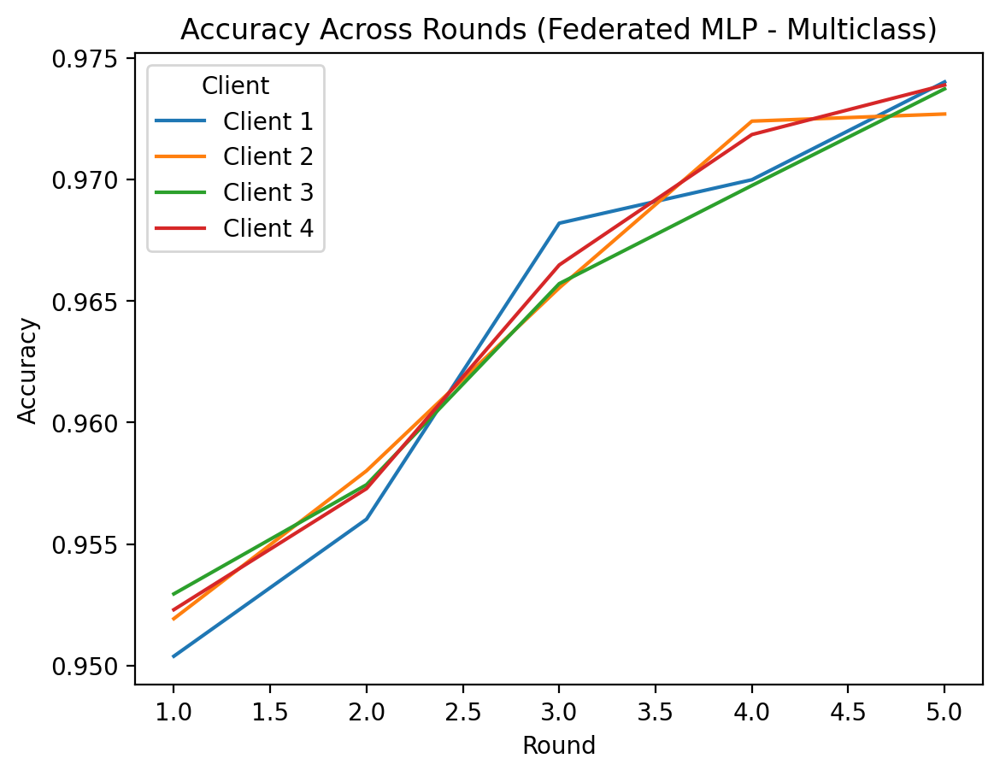

In [28]:

# === Performance Visualization ===
round_performance_df = pd.DataFrame(round_performance)
sns.lineplot(data=round_performance_df, x="Round", y="Accuracy", hue="Client")
plt.title("Accuracy Across Rounds (Federated MLP - Multiclass)")
plt.show()


Confusion Matrix for Global Model:
[[  6587      0      0      0      0      0      0      0      0    248
     373      0      0      0      0]
 [     1  13033      0      0      0      0      0      0      0      0
       0      0      0    328   1200]
 [     0      0  20367      0      0     15      0      0      0      0
       0      0      0      0      0]
 [     0      0      1  15018      0      0      0      0      0      0
       0      0      0      0      0]
 [     0      0      0      0  36471      0      0      0      0      0
       0      0      0      0      0]
 [    38      0     54      0      0    116      0      0      0     48
       0      0      0      0      0]
 [     0      0      0      0      0      0    108      0      0      0
       0      0      0      0      0]
 [     0      0      1      0      0      0      0 409200      0      0
       0      0      0      0      0]
 [     0      0      0      0      0      0      0      0  10711      0
       0   2

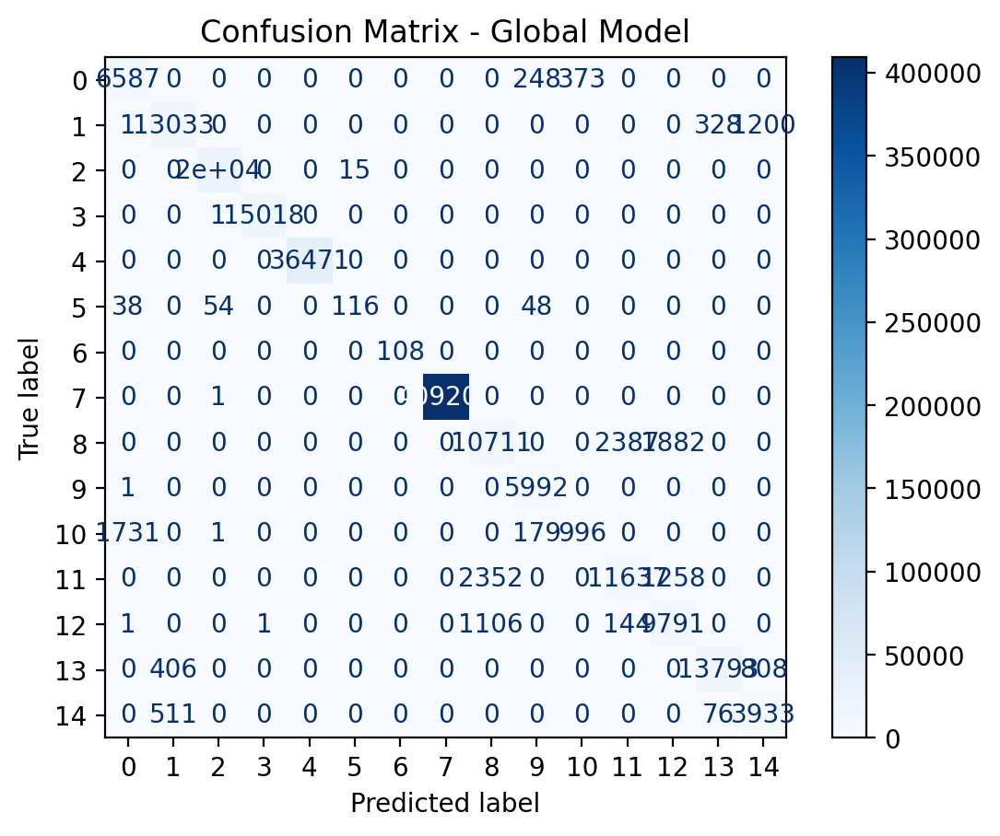

In [30]:
# After all federated learning rounds have completed

# Set final global model weights
global_model.coefs_ = global_weights
global_model.intercepts_ = global_biases

# Create a global test set by combining all clients' test data
X_global_test = np.vstack([client_test_data[i][0] for i in range(len(client_test_data))])
y_global_test = np.hstack([client_test_data[i][1] for i in range(len(client_test_data))])

# Predict with the global model
y_pred_global = global_model.predict(X_global_test)

# Compute the confusion matrix for the global model
cm_global = confusion_matrix(y_global_test, y_pred_global, labels=all_classes)
print(f"\nConfusion Matrix for Global Model:\n{cm_global}")
disp = ConfusionMatrixDisplay(confusion_matrix=cm_global, display_labels=all_classes)
disp.plot(cmap="Blues")
plt.title("Confusion Matrix - Global Model")
plt.show()



Generating LIME explanations for a sample prediction...



Explaining class: 0


100%|██████████| 100/100 [00:01<00:00, 59.17it/s]


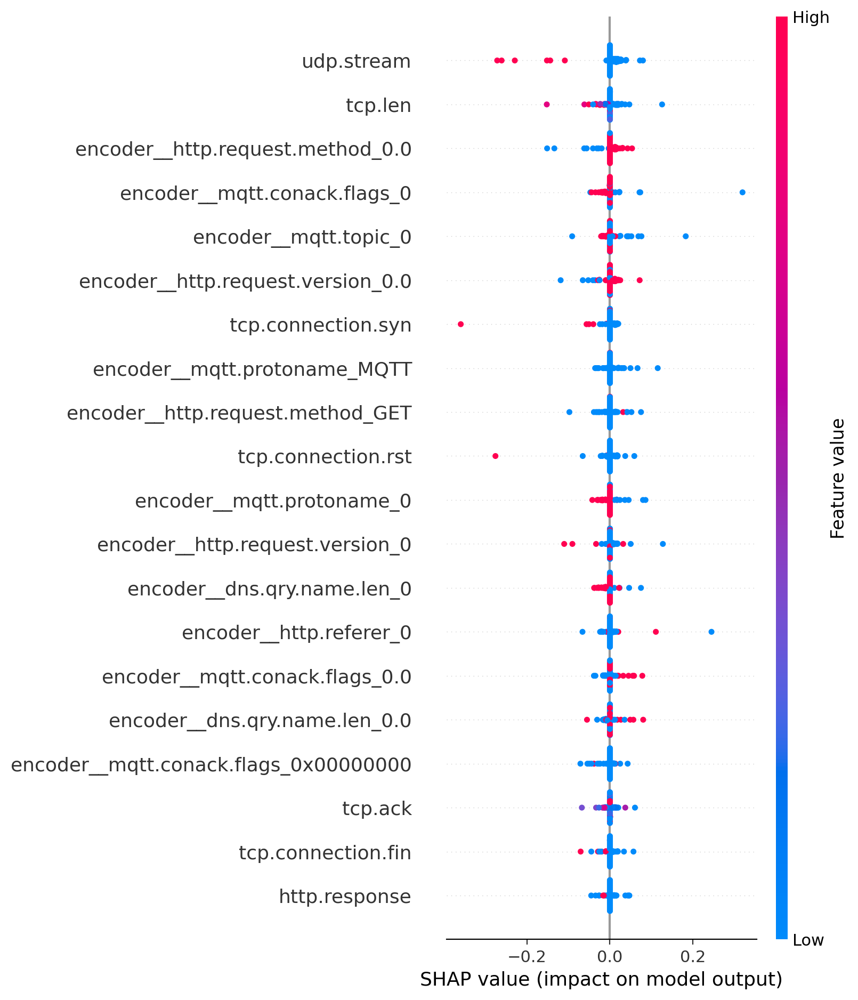


Explaining class: 1


100%|██████████| 100/100 [00:01<00:00, 59.94it/s]


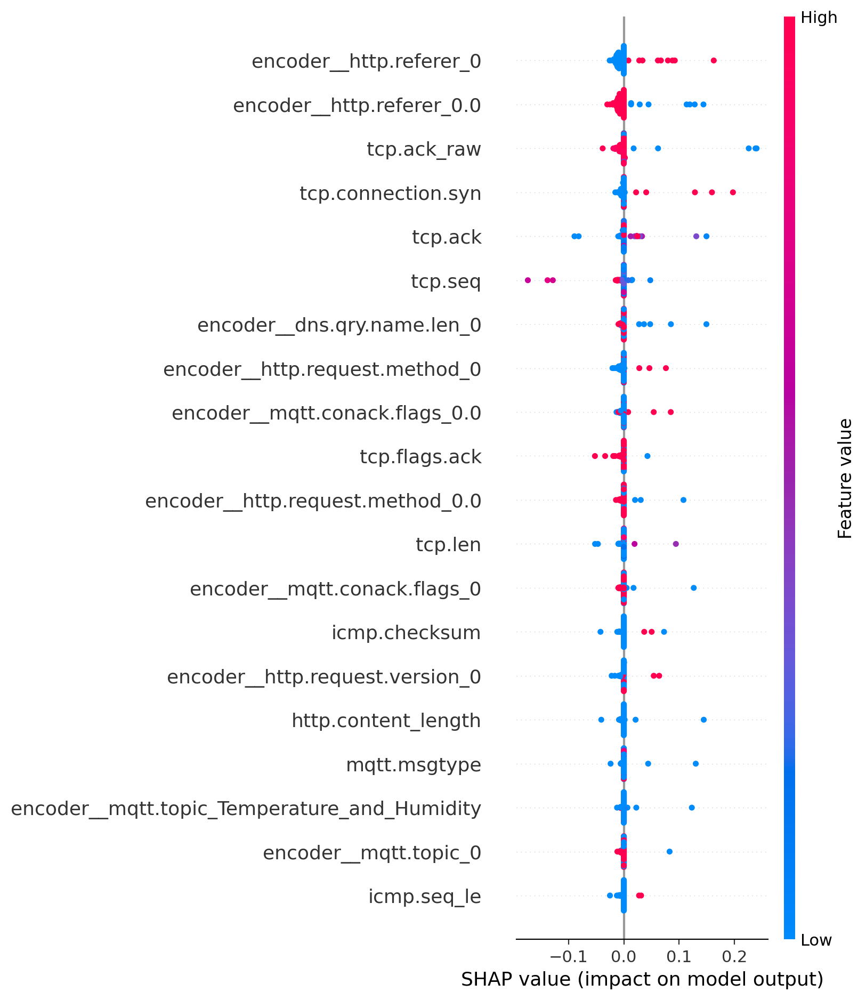

In [41]:
loaded_model = joblib.load("saved_models/global_final.joblib")
# === LIME Explainability for Local Model ===
print(f"\nGenerating LIME explanations for a sample prediction...")

lime_explainer = LimeTabularExplainer(
    training_data=client_train_data[0][0].values,
    feature_names=client_test_data[0][0].columns,
    class_names=[str(cls) for cls in np.unique(client_test_data[0][1])],
    mode="classification"
)

sample_idx = 0
X_explainer = client_test_data[0][0].values
lime_exp = lime_explainer.explain_instance(
    data_row=X_explainer[sample_idx],
    predict_fn=loaded_model.predict_proba,
    labels=list(range(15))  # Replace with actual class indices
)

# for i in range(1):  # first 3 samples
#     print(f"\n=== Explanation for sample {i} ===")
#     exp = lime_explainer.explain_instance(
#         data_row=X_explainer[i],
#         predict_fn=loaded_model.predict_proba,
#         labels=list(range(15)),
#         num_features=10
#     )
#     exp.show_in_notebook(labels=tuple(range(15)))



# === 🛠 FIX: Patch the method before calling it
from IPython.display import display, HTML
from lime.explanation import Explanation

def patched_show_in_notebook(self, labels=None, predict_proba=True, show_predicted_value=True, **kwargs):
    display(HTML(self.as_html(
        labels=labels,
        predict_proba=predict_proba,
        show_predicted_value=show_predicted_value,
        **kwargs
    )))

Explanation.show_in_notebook = patched_show_in_notebook

# ✅ Visualize explanation for class 1 (you can change to 0, 2, etc.)
lime_exp.show_in_notebook(labels=tuple(range(15)))

# for class_idx in range(15):
#     print(f"\nTop features for class {class_idx}:")
#     print(lime_exp.as_list(label=class_idx))


# Define prediction wrapper for each class
def predict_class_prob(class_index):
    return lambda x: loaded_model.predict_proba(x)[:, class_index]

# Use a manageable sample size for explanation
sample_size = 100
X_explainer = client_test_data[0][0].sample(n=sample_size, random_state=42)

# Class and feature names
feature_names = X_explainer.columns
class_names = [str(cls) for cls in np.unique(client_test_data[0][1])]

# Loop over each class
# for class_index, class_name in enumerate(class_names):
for class_index, class_name in enumerate(range(2)):
    print(f"\nExplaining class: {class_name}")

    # Initialize SHAP KernelExplainer
    explainer = shap.KernelExplainer(
        predict_class_prob(class_index),
        X_explainer,  # Background data
    )

    # Compute SHAP values with limited nsamples
    shap_values = explainer.shap_values(X_explainer, nsamples=100)

    # Plot SHAP summary
    shap.summary_plot(
        shap_values,
        X_explainer,
        feature_names=feature_names,
        plot_type="dot",
        show=True
    )




Generating LIME explanations for a sample prediction...



Explaining class: 0


100%|██████████| 100/100 [00:01<00:00, 60.71it/s]


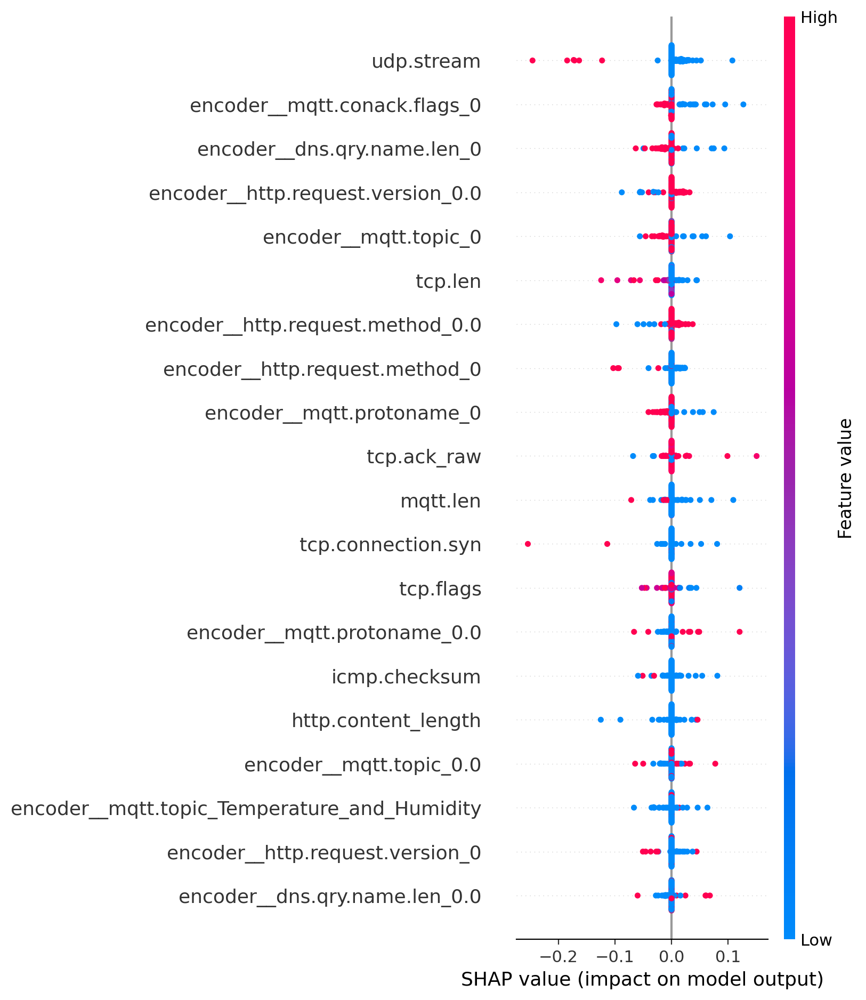


Explaining class: 1


100%|██████████| 100/100 [00:01<00:00, 58.94it/s]


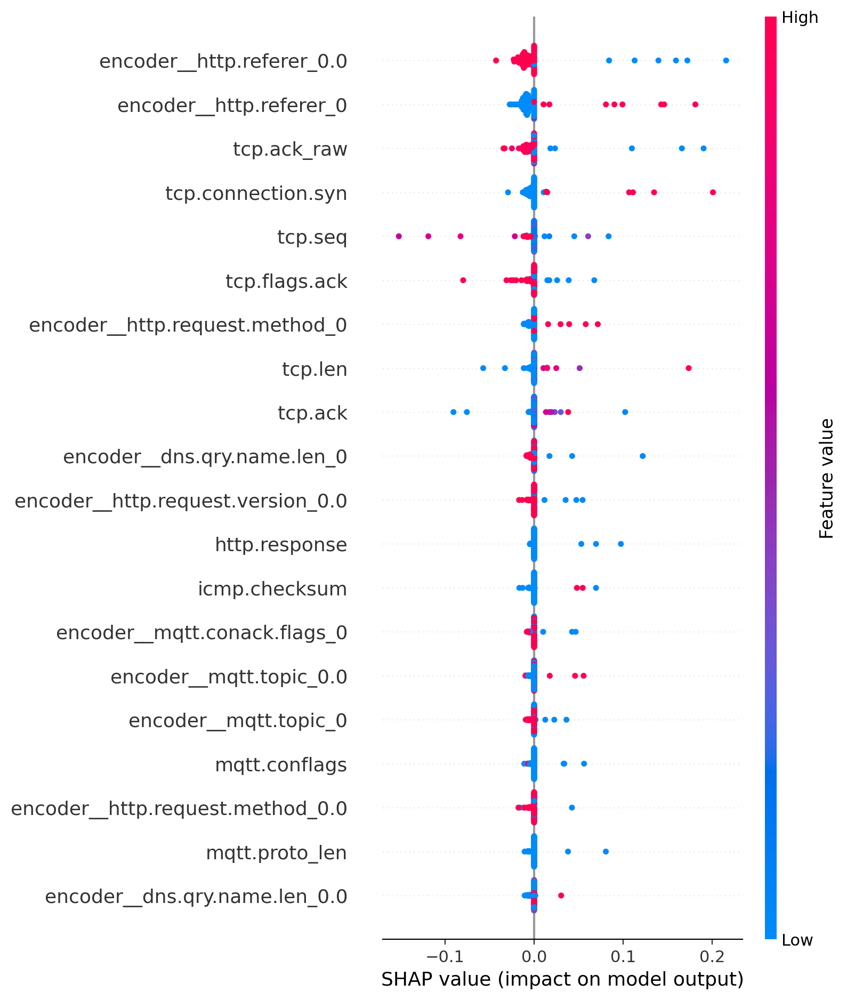

In [40]:

loaded_model_1 = joblib.load("saved_models/client_1_final.joblib")

# =========== LIME Explainability for Local Model ========================
print(f"\nGenerating LIME explanations for a sample prediction...")

lime_explainer = LimeTabularExplainer(
    training_data=client_train_data[0][0].values,
    feature_names=client_test_data[0][0].columns,
    class_names=[str(cls) for cls in np.unique(client_test_data[0][1])],
    mode="classification"
)

sample_idx = 0
X_explainer = client_test_data[0][0].values
lime_exp = lime_explainer.explain_instance(
    data_row=X_explainer[sample_idx],
    predict_fn=loaded_model_1.predict_proba,
    labels=list(range(15))  # Replace with actual class indices
)

# for i in range(1):  # first 3 samples
#     print(f"\n=== Explanation for sample {i} ===")
#     exp = lime_explainer.explain_instance(
#         data_row=X_explainer[i],
#         predict_fn=loaded_model_1.predict_proba,
#         labels=list(range(15)),
#         num_features=10
#     )
#     exp.show_in_notebook(labels=tuple(range(15)))



# === 🛠 FIX: Patch the method before calling it
from IPython.display import display, HTML
from lime.explanation import Explanation

def patched_show_in_notebook(self, labels=None, predict_proba=True, show_predicted_value=True, **kwargs):
    display(HTML(self.as_html(
        labels=labels,
        predict_proba=predict_proba,
        show_predicted_value=show_predicted_value,
        **kwargs
    )))

Explanation.show_in_notebook = patched_show_in_notebook

# ✅ Visualize explanation for class 1 (you can change to 0, 2, etc.)
lime_exp.show_in_notebook(labels=tuple(range(15)))

# for class_idx in range(15):
#     print(f"\nTop features for class {class_idx}:")
#     print(lime_exp.as_list(label=class_idx))


# =========== Shape Explainability ========================


# Define prediction wrapper for each class
def predict_class_prob(class_index):
    return lambda x: loaded_model_1.predict_proba(x)[:, class_index]

# Use a manageable sample size for explanation
sample_size = 100
X_explainer = client_test_data[0][0].sample(n=sample_size, random_state=42)

# Class and feature names
feature_names = X_explainer.columns
class_names = [str(cls) for cls in np.unique(client_test_data[0][1])]

# Loop over each class
# for class_index, class_name in enumerate(class_names):
for class_index, class_name in enumerate(range(2)):
    print(f"\nExplaining class: {class_name}")

    # Initialize SHAP KernelExplainer
    explainer = shap.KernelExplainer(
        predict_class_prob(class_index),
        X_explainer,  # Background data
    )

    # Compute SHAP values with limited nsamples
    shap_values = explainer.shap_values(X_explainer, nsamples=100)

    # Plot SHAP summary
    shap.summary_plot(
        shap_values,
        X_explainer,
        feature_names=feature_names,
        plot_type="dot",
        show=True
    )



Generating LIME explanations for a sample prediction...



Explaining class: 0


100%|██████████| 100/100 [00:01<00:00, 62.28it/s]


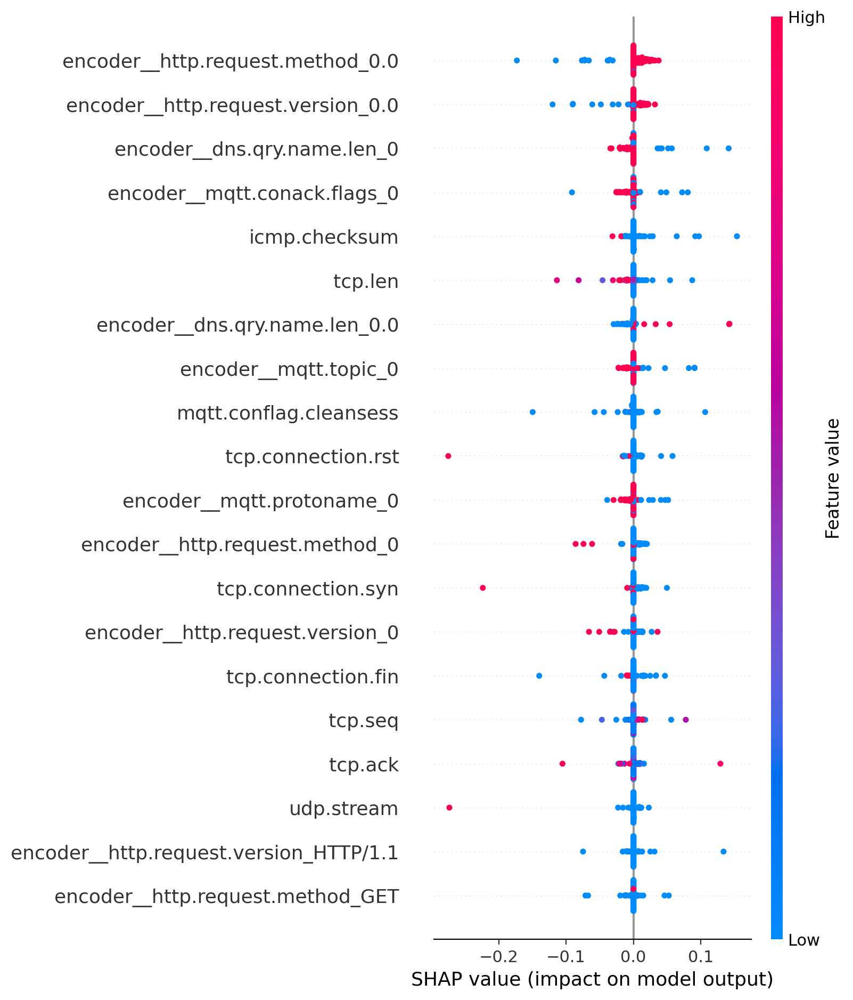


Explaining class: 1


100%|██████████| 100/100 [00:01<00:00, 61.34it/s]


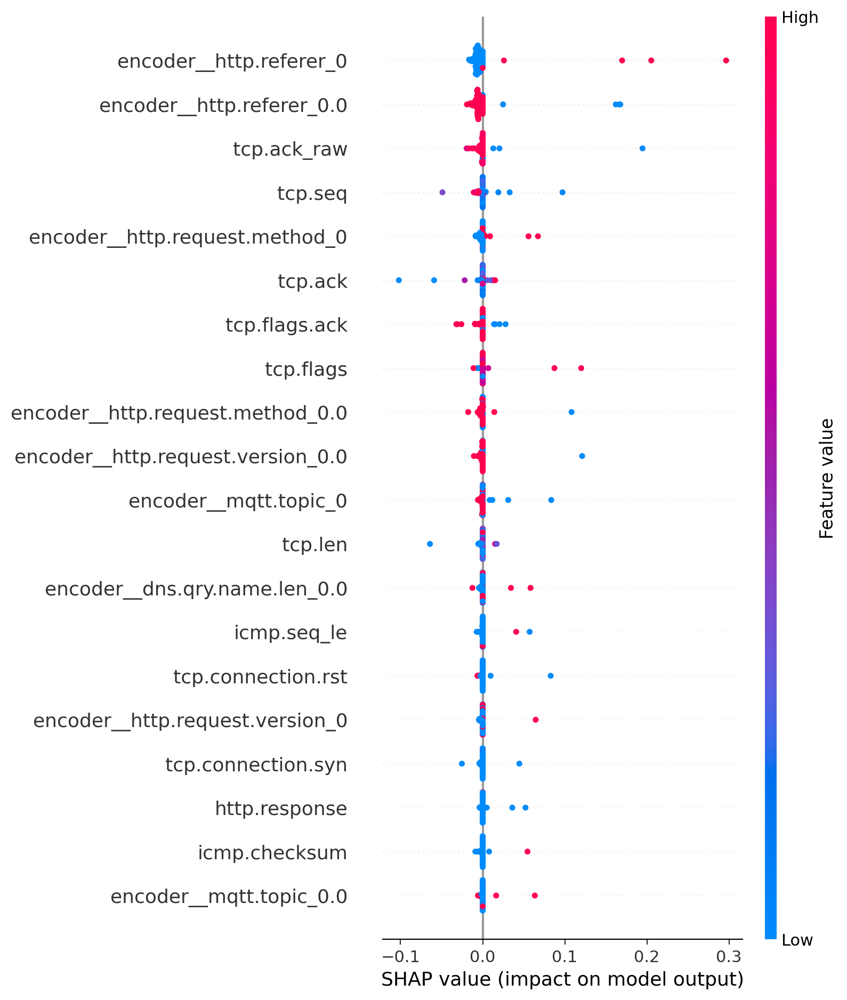

In [42]:

loaded_model_2 = joblib.load("saved_models/client_2_final.joblib")

# === LIME Explainability for Local Model ===
print(f"\nGenerating LIME explanations for a sample prediction...")

lime_explainer = LimeTabularExplainer(
    training_data=client_train_data[1][0].values,
    feature_names=client_test_data[1][0].columns,
    class_names=[str(cls) for cls in np.unique(client_test_data[1][1])],
    mode="classification"
)

sample_idx = 0
X_explainer = client_test_data[1][0].values
lime_exp = lime_explainer.explain_instance(
    data_row=X_explainer[sample_idx],
    predict_fn=loaded_model_2.predict_proba,
    labels=list(range(15))  # Replace with actual class indices
)

# for i in range(1):  # first 3 samples
#     print(f"\n=== Explanation for sample {i} ===")
#     exp = lime_explainer.explain_instance(
#         data_row=X_explainer[i],
#         predict_fn=loaded_model_2.predict_proba,
#         labels=list(range(15)),
#         num_features=10
#     )
#     exp.show_in_notebook(labels=tuple(range(15)))



# === 🛠 FIX: Patch the method before calling it
from IPython.display import display, HTML
from lime.explanation import Explanation

def patched_show_in_notebook(self, labels=None, predict_proba=True, show_predicted_value=True, **kwargs):
    display(HTML(self.as_html(
        labels=labels,
        predict_proba=predict_proba,
        show_predicted_value=show_predicted_value,
        **kwargs
    )))

Explanation.show_in_notebook = patched_show_in_notebook

# ✅ Visualize explanation for class 1 (you can change to 0, 2, etc.)
lime_exp.show_in_notebook(labels=tuple(range(15)))

# for class_idx in range(15):
#     print(f"\nTop features for class {class_idx}:")
#     print(lime_exp.as_list(label=class_idx))



# Define prediction wrapper for each class
def predict_class_prob(class_index):
    return lambda x: loaded_model_2.predict_proba(x)[:, class_index]

# Use a manageable sample size for explanation
sample_size = 100
X_explainer = client_test_data[1][0].sample(n=sample_size, random_state=42)

# Class and feature names
feature_names = X_explainer.columns
class_names = [str(cls) for cls in np.unique(client_test_data[1][1])]

# Loop over each class
# for class_index, class_name in enumerate(class_names):
for class_index, class_name in enumerate(range(2)):
    print(f"\nExplaining class: {class_name}")

    # Initialize SHAP KernelExplainer
    explainer = shap.KernelExplainer(
        predict_class_prob(class_index),
        X_explainer,  # Background data
    )

    # Compute SHAP values with limited nsamples
    shap_values = explainer.shap_values(X_explainer, nsamples=100)

    # Plot SHAP summary
    shap.summary_plot(
        shap_values,
        X_explainer,
        feature_names=feature_names,
        plot_type="dot",
        show=True
    )



Generating LIME explanations for a sample prediction...



Explaining class: 0


100%|██████████| 100/100 [00:01<00:00, 61.54it/s]


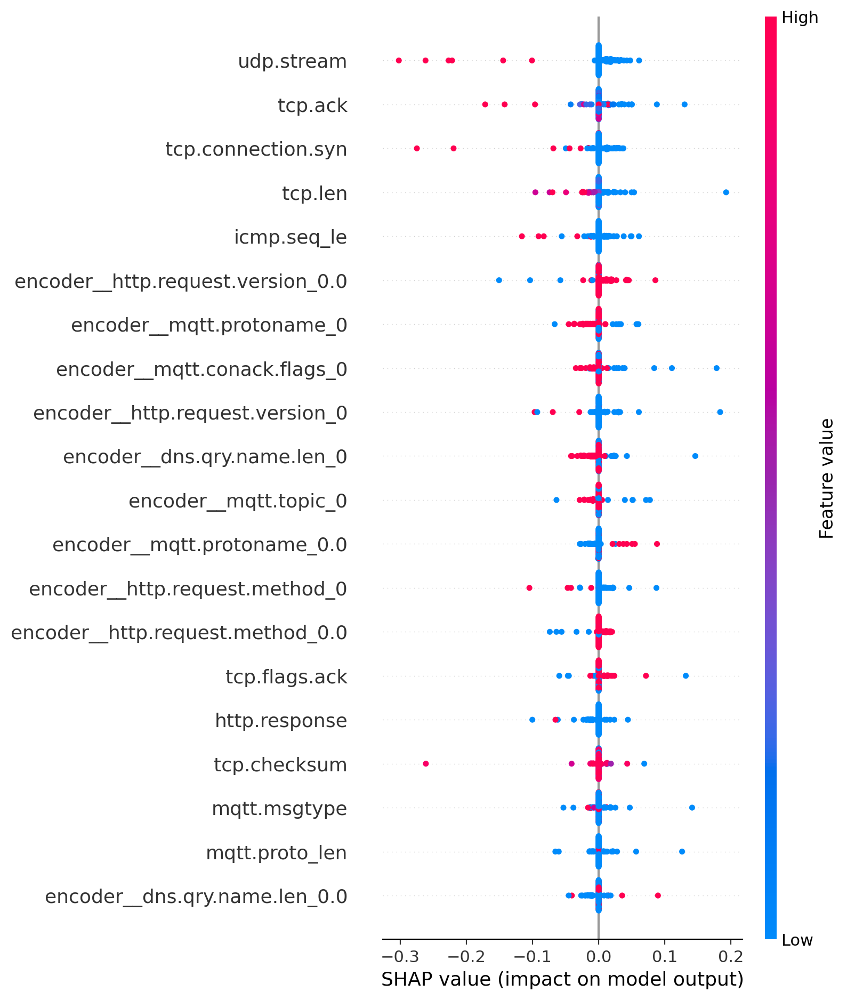


Explaining class: 1


100%|██████████| 100/100 [00:01<00:00, 59.49it/s]


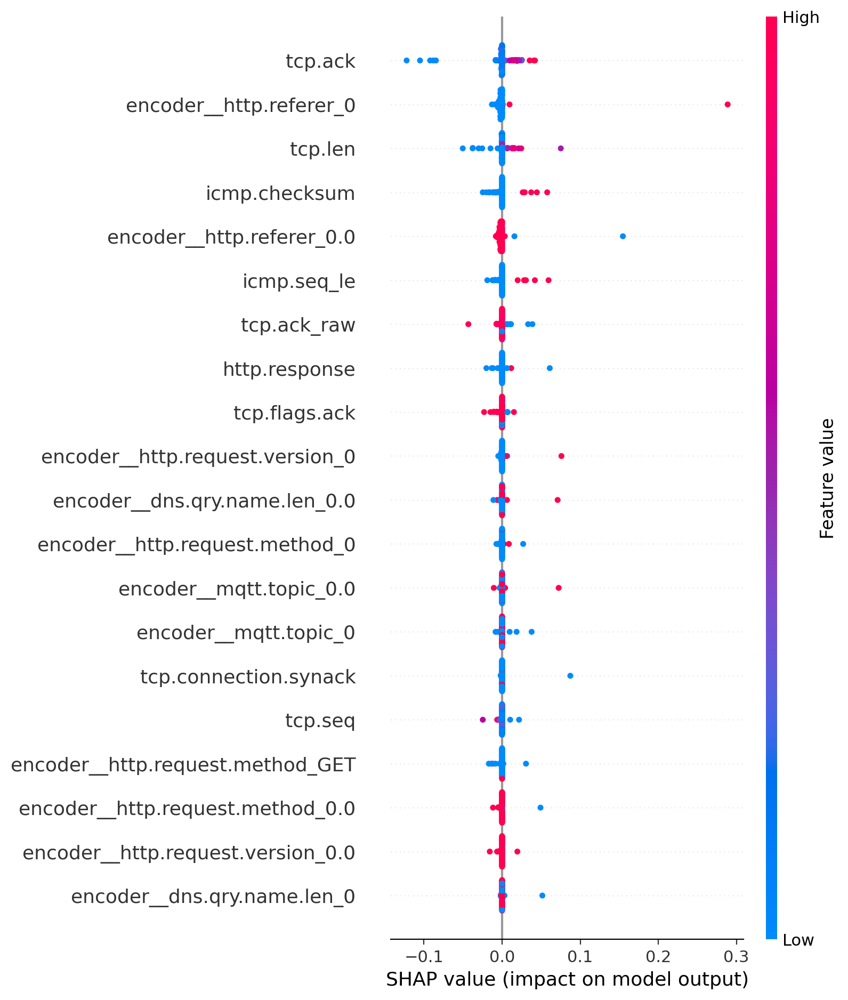

In [43]:

loaded_model_2 = joblib.load("saved_models/client_3_final.joblib")

# === LIME Explainability for Local Model ===
print(f"\nGenerating LIME explanations for a sample prediction...")

lime_explainer = LimeTabularExplainer(
    training_data=client_train_data[2][0].values,
    feature_names=client_test_data[2][0].columns,
    class_names=[str(cls) for cls in np.unique(client_test_data[1][1])],
    mode="classification"
)

sample_idx = 0
X_explainer = client_test_data[2][0].values
lime_exp = lime_explainer.explain_instance(
    data_row=X_explainer[sample_idx],
    predict_fn=loaded_model_2.predict_proba,
    labels=list(range(15))  # Replace with actual class indices
)

# for i in range(1):  # first 3 samples
#     print(f"\n=== Explanation for sample {i} ===")
#     exp = lime_explainer.explain_instance(
#         data_row=X_explainer[i],
#         predict_fn=loaded_model_2.predict_proba,
#         labels=list(range(15)),
#         num_features=10
#     )
#     exp.show_in_notebook(labels=tuple(range(15)))



# === 🛠 FIX: Patch the method before calling it
from IPython.display import display, HTML
from lime.explanation import Explanation

def patched_show_in_notebook(self, labels=None, predict_proba=True, show_predicted_value=True, **kwargs):
    display(HTML(self.as_html(
        labels=labels,
        predict_proba=predict_proba,
        show_predicted_value=show_predicted_value,
        **kwargs
    )))

Explanation.show_in_notebook = patched_show_in_notebook

# ✅ Visualize explanation for class 1 (you can change to 0, 2, etc.)
lime_exp.show_in_notebook(labels=tuple(range(15)))

# for class_idx in range(15):
#     print(f"\nTop features for class {class_idx}:")
#     print(lime_exp.as_list(label=class_idx))



# Define prediction wrapper for each class
def predict_class_prob(class_index):
    return lambda x: loaded_model_2.predict_proba(x)[:, class_index]

# Use a manageable sample size for explanation
sample_size = 100
X_explainer = client_test_data[2][0].sample(n=sample_size, random_state=42)

# Class and feature names
feature_names = X_explainer.columns
class_names = [str(cls) for cls in np.unique(client_test_data[2][1])]

# Loop over each class
# for class_index, class_name in enumerate(class_names):
for class_index, class_name in enumerate(range(2)):
    print(f"\nExplaining class: {class_name}")

    # Initialize SHAP KernelExplainer
    explainer = shap.KernelExplainer(
        predict_class_prob(class_index),
        X_explainer,  # Background data
    )

    # Compute SHAP values with limited nsamples
    shap_values = explainer.shap_values(X_explainer, nsamples=100)

    # Plot SHAP summary
    shap.summary_plot(
        shap_values,
        X_explainer,
        feature_names=feature_names,
        plot_type="dot",
        show=True
    )



Generating LIME explanations for a sample prediction...



Explaining class: 0


100%|██████████| 100/100 [00:01<00:00, 62.89it/s]


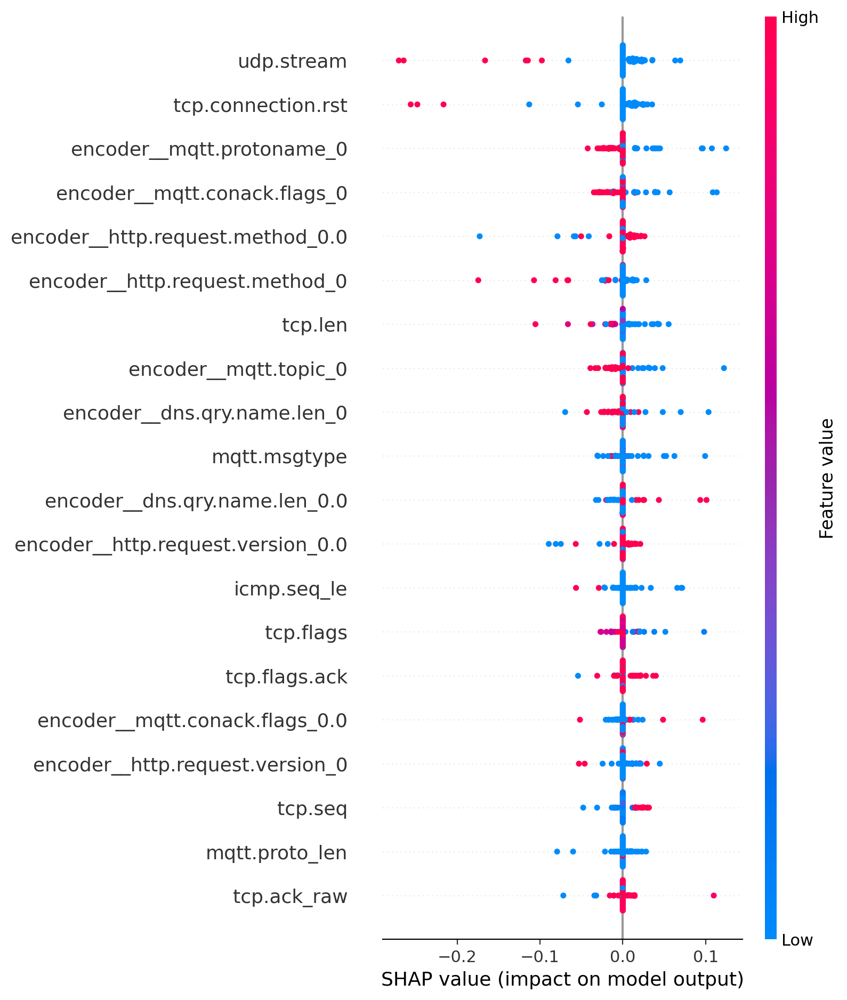


Explaining class: 1


100%|██████████| 100/100 [00:01<00:00, 62.19it/s]


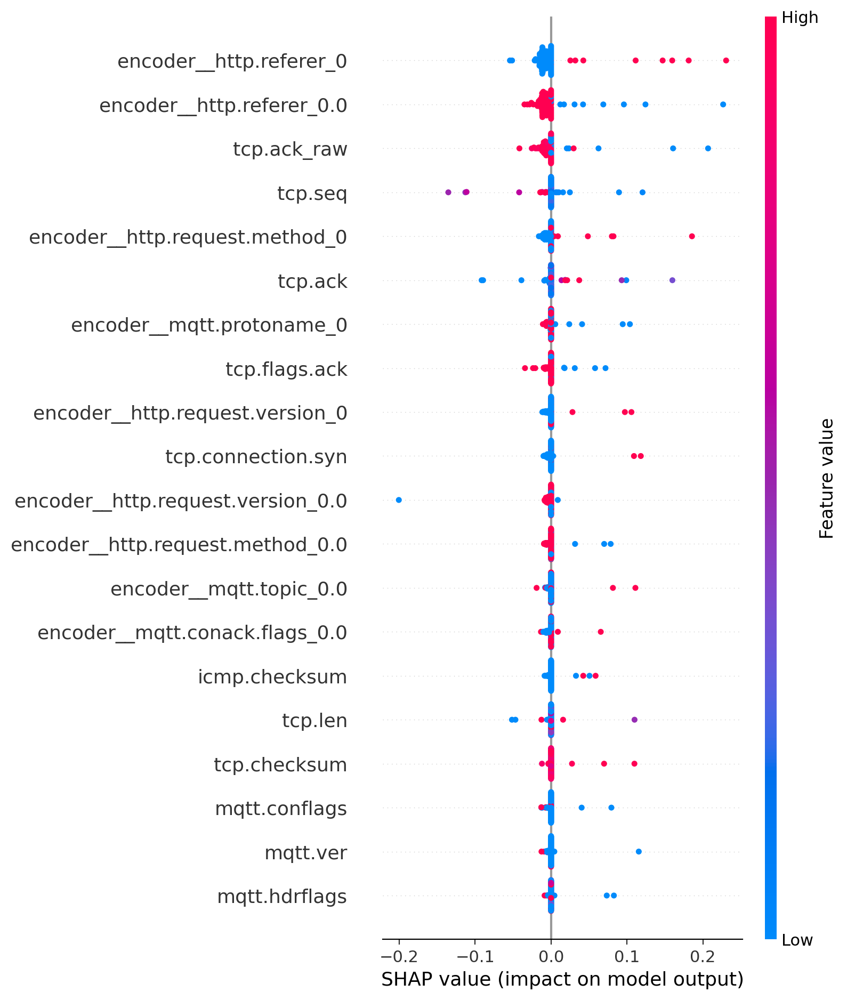

In [44]:

loaded_model_2 = joblib.load("saved_models/client_4_final.joblib")

# === LIME Explainability for Local Model ===
print(f"\nGenerating LIME explanations for a sample prediction...")

lime_explainer = LimeTabularExplainer(
    training_data=client_train_data[3][0].values,
    feature_names=client_test_data[3][0].columns,
    class_names=[str(cls) for cls in np.unique(client_test_data[3][1])],
    mode="classification"
)

sample_idx = 0
X_explainer = client_test_data[3][0].values
lime_exp = lime_explainer.explain_instance(
    data_row=X_explainer[sample_idx],
    predict_fn=loaded_model_2.predict_proba,
    labels=list(range(15))  # Replace with actual class indices
)

# for i in range(1):  # first 3 samples
#     print(f"\n=== Explanation for sample {i} ===")
#     exp = lime_explainer.explain_instance(
#         data_row=X_explainer[i],
#         predict_fn=loaded_model_2.predict_proba,
#         labels=list(range(15)),
#         num_features=10
#     )
#     exp.show_in_notebook(labels=tuple(range(15)))



# === 🛠 FIX: Patch the method before calling it
from IPython.display import display, HTML
from lime.explanation import Explanation

def patched_show_in_notebook(self, labels=None, predict_proba=True, show_predicted_value=True, **kwargs):
    display(HTML(self.as_html(
        labels=labels,
        predict_proba=predict_proba,
        show_predicted_value=show_predicted_value,
        **kwargs
    )))

Explanation.show_in_notebook = patched_show_in_notebook

# ✅ Visualize explanation for class 1 (you can change to 0, 2, etc.)
lime_exp.show_in_notebook(labels=tuple(range(15)))

# for class_idx in range(15):
#     print(f"\nTop features for class {class_idx}:")
#     print(lime_exp.as_list(label=class_idx))



# Define prediction wrapper for each class
def predict_class_prob(class_index):
    return lambda x: loaded_model_2.predict_proba(x)[:, class_index]

# Use a manageable sample size for explanation
sample_size = 100
X_explainer = client_test_data[3][0].sample(n=sample_size, random_state=42)

# Class and feature names
feature_names = X_explainer.columns
class_names = [str(cls) for cls in np.unique(client_test_data[3][1])]

# Loop over each class
# for class_index, class_name in enumerate(class_names):
for class_index, class_name in enumerate(range(2)):
    print(f"\nExplaining class: {class_name}")

    # Initialize SHAP KernelExplainer
    explainer = shap.KernelExplainer(
        predict_class_prob(class_index),
        X_explainer,  # Background data
    )

    # Compute SHAP values with limited nsamples
    shap_values = explainer.shap_values(X_explainer, nsamples=100)

    # Plot SHAP summary
    shap.summary_plot(
        shap_values,
        X_explainer,
        feature_names=feature_names,
        plot_type="dot",
        show=True
    )
